<a href="https://colab.research.google.com/github/Fibonacci1664/Pix2Pix/blob/main/MyPix2Pix_18.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **IMPORTS**

In [1]:
import tensorflow as tf

import os
import pathlib
import time
import datetime
import numpy as np
import sys

from matplotlib import pyplot as plt
from IPython import display

import keras.utils as image
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras import Input
from keras.layers import Conv2D
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import BatchNormalization
from keras.layers import AveragePooling2D
from keras.layers import MaxPooling2D
from keras.utils.vis_utils import plot_model
from keras.layers import Conv2DTranspose
from keras.layers import Dropout
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.metrics import Mean

print(tf.__version__)
print(sys.version)

2.12.0
3.9.16 (main, Dec  7 2022, 01:11:51) 
[GCC 9.4.0]


# **LOAD SKETCH2POKEMON DATASET**

(256, 512, 3)


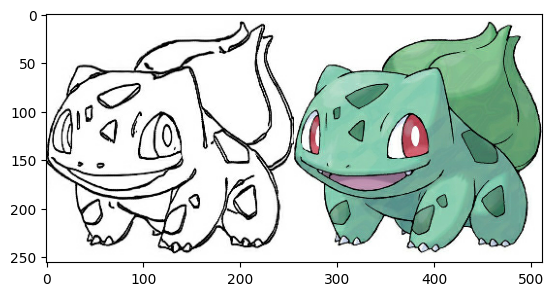

In [2]:
input_file = '/content'

PATH = input_file

# Each original image is of size 256 x 512, which in and of itself contains two 256 x 256 images
# Print out a sample image to ensure the dataset has loaded correctly
sample_image = tf.io.read_file(str(PATH+'/train/0.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

plt.figure()
plt.imshow(sample_image)

# **PREPROCESS DATA**

### **SPLIT IMAGES INTO TWO SEPARATE IMAGES, REAL/LABEL or TARGET/INPUT**

(256, 256, 3)


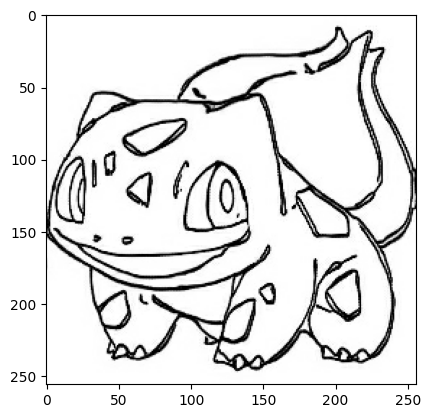

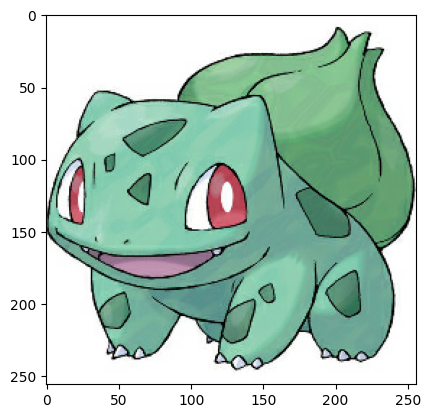

In [3]:
# Define a function that loads image files and outputs two image tensors, these two images will be the 256 x 512 separated

# Image file is Python object
def load(image_file):
    # Read and decode an image file to a uint8 tensor
    image = tf.io.read_file(image_file)     # Tensor
    image = tf.io.decode_jpeg(image)

    # Split each image tensor into two tensors:
    # - one with the sketch image
    # - one with the real image
    w = tf.shape(image)[1]                # 512                 # Tensor
    w = w // 2                            # 256
    sketch_image = image[:, :w, :]        # From start - 256    # Tensor
    real_image = image[:, w:, :]          # From 256 - end      # Tensor

    # Convert both images to float32 tensors
    sketch_image = tf.cast(sketch_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    # print("sketch_image shape: ", sketch_image.shape)
    # print("real_image shape: ", real_image.shape)

    return sketch_image, real_image

# Plot a sample of the input (sketch image) and real images
sketch, real = load(str(PATH+'/train/0.jpg'))                   # Tensors

print(sketch.shape)

# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(sketch / 255.0)
plt.figure()
plt.imshow(real / 255.0)

### **HELPER FUNCTIONS TO AUGMENT DATA**

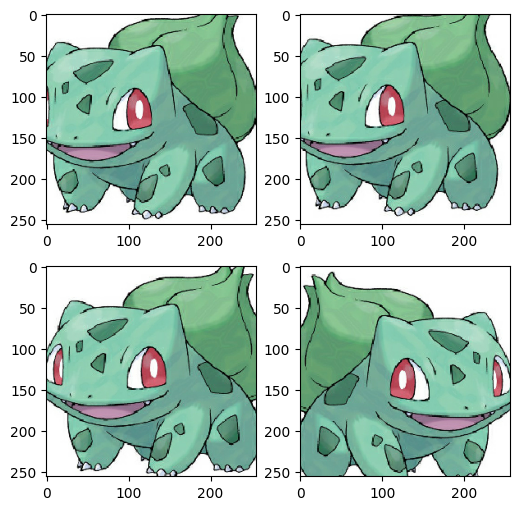

In [4]:
# As described in the pix2pix paper, apply random jittering and mirroring to preprocess the training set.

# Define several functions that:

# Resize each 256 x 256 image to a larger height and width, 286 x 286.
# Randomly crop it back to 256 x 256.
# Randomly flip the image horizontally i.e. left to right (random mirroring).
# Normalize the images to the [-1, 1] range.

# The pokemon train set has 664 images
BUFFER_SIZE = 664
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

# Normalizing the images to [-1, 1] using scaling normalization
def normalize_two(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

# Normalizing the image to [-1, 1] using scaling normalization
def normalize_one(input_image):
    input_image = (input_image / 127.5) - 1
    return input_image

# Normalizing the images to [-1, 1] using channel-wise mean subtraction normalization
# This is important as this is what the vgg-16 network used to train on
# Something is not quite right with this as it's causing streaking type artefact across the generated images
def normalize_channel_wise_two(input_image, real_image):
    mean = tf.reduce_mean(input_image, axis=(1, 2), keepdims=True)
    std = tf.math.reduce_std(input_image, axis=(1, 2), keepdims=True)
    input_image = (input_image - mean) / std
    real_image = (real_image - mean) / std
    
    return input_image, real_image

# Normalizing a single image to [-1, 1] using channel-wise mean subtraction normalization
# This is important as this is what the vgg-16 network used to train on
def normalize_channel_wise_one(input_image):
    mean = tf.reduce_mean(input_image, axis=(1, 2), keepdims=True)
    std = tf.math.reduce_std(input_image, axis=(1, 2), keepdims=True)
    input_image = (input_image - mean) / std 
    
    return input_image

def random_jitter(input_image, real_image):
    # Resizing to 286x286
    input_image, real_image = resize(input_image, real_image, 286, 286)

    # Random cropping back to 256x256
    input_image, real_image = random_crop(input_image, real_image) 

    if tf.random.uniform(()) > 0.5:
        # Random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

# Inspect some of the preprocessed output
plt.figure(figsize=(6, 6))

for i in range(4):
    rand_jit_sketch, rand_jit_real = random_jitter(sketch, real)
    plt.subplot(2, 2, i + 1)
    #plt.imshow(rand_jit_sketch / 255.0)
    plt.imshow(rand_jit_real / 255.0)
    plt.axis('on')

plt.show()

### **HELPER FUNCTIONS THAT LOAD AND PREPROCESS THE TRAIN/TEST SETS**

In [5]:
# Helper functions that load and preprocess the training and test sets
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize_two(input_image, real_image)
    #input_image, real_image = normalize_channel_wise_two(input_image, real_image)

    return input_image, real_image # Tensors

def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image, IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize_two(input_image, real_image)
    #input_image, real_image = normalize_channel_wise_two(input_image, real_image)

    return input_image, real_image # Tensors

# **BUILD INPUT PIPELINE**

In [6]:
# Build an input pipeline with tf.data
train_dataset = tf.data.Dataset.list_files(str(PATH+'/train/*.jpg'))
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE) # Tensor

#print("Total number of samples:", train_dataset.cardinality().numpy())

try:
    test_dataset = tf.data.Dataset.list_files(str(PATH+'/test/*.jpg'))
except tf.errors.InvalidArgumentError:
    test_dataset = tf.data.Dataset.list_files(str(PATH+'/val/*.jpg'))

test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE) # Tensor

# **DUAL MASK INJECTION**

In [7]:
def dual_mask_injection(feat, mask, in_channels):

    # Declare trainable weights and biases for "value relocation"
    # when combined with contour and plain area features
    weight_c = tf.Variable(tf.ones((1, 1, 1, in_channels))*1.1)
    weight_p = tf.Variable(tf.ones((1, 1, 1, in_channels))*0.9)

    bias_c = tf.Variable(tf.zeros((1, 1, 1, in_channels))+0.01)
    bias_p = tf.Variable(tf.zeros((1, 1, 1, in_channels))+0.01)

    feat_c = weight_c * (feat * mask) + bias_c
    feat_p = weight_p * (feat * (1-mask)) + bias_p

    final_tensor = feat_c + feat_p

    return final_tensor

# **FEATURE MAP TRANSFORMATION**

In [9]:
# Step 1:
# Get the Contour features (C) and Plain-area feature (P)
# Use the style-image's sketch as a mask (M), so we can filter the values in the style-image's feature maps (F)
# With (M*F): (element-wise), we can get a feature-map (FM_C), that only have the feature values of the contours, 
# and with (1-M)*F: (element-wise), we can get the (FM_P) with features only around the plain areas of the image.
# Then we use a max-pooling layer to extract the filtered feature values, because the filtered feature-map will be sparse
# Finally, we will have two 4x4 feature-maps, one for the edge and one for the rest.

# Step 2:
# Then we impose the features into the content feature map. To begin with, we fill a blank feature-map with same size 
# of the content feature-map with the Edge feature-map, then we use the content-sketch as mask to filter this feature map.
# Do the same thing with Plain feature-map. Then we can add the 2 feature-maps into one.

def FeatMapTransfer(style_feat, style_skt_feat, content_skt_feat, hw=8):

    ######### STEP 1 #########
    style_skt = AveragePooling2D(pool_size=hw, strides=1, padding="valid")(style_skt_feat)
    #print("style_skt shape in FMT: ", style_skt.shape)
    content_skt = AveragePooling2D(pool_size=hw, strides=1, padding="valid")(content_skt_feat)
    #print("content_skt shape in FMT: ", content_skt.shape)

    content_feat = style_feat * style_skt
    #print("content_feat shape in FMT: ", content_feat.shape)
    plain_feat = style_feat * (1-style_skt)
    #print("plain_feat shape in FMT: ", plain_feat.shape)

    ######### STEP 2 CONTENT AREA #########
    content_feat = MaxPooling2D(pool_size=(4, 4), strides=(2, 2), padding='same')(content_feat)
    #print("content_feat shape in FMT, first pool: ", content_feat.shape)
    content_feat = MaxPooling2D(pool_size=(4, 4), strides=(1, 1), padding='same')(content_feat)
    #print("content_feat shape in FMT, second pool: ", content_feat.shape)
    content_feat = AveragePooling2D(pool_size=(1, 1), strides=(1, 1), padding='valid')(content_feat)
    #print("content_feat shape in FMT, avg pool 2d: ", content_feat.shape)

    ######### STEP 2 PLAIN AREA #########
    plain_feat = MaxPooling2D(pool_size=(4, 4), strides=(2, 2), padding='same')(plain_feat)
    #print("plain_feat shape in FMT, first pool: ", plain_feat.shape)
    plain_feat = MaxPooling2D(pool_size=(4, 4), strides=(1, 1), padding='same')(plain_feat)
    #print("plain_feat shape in FMT, second pool: ", plain_feat.shape)
    plain_feat = AveragePooling2D(pool_size=(1, 1), strides=(1, 1), padding='valid')(plain_feat)
    #print("plain_feat shape in FMT, avg pool 2d: ", plain_feat.shape)

    ######### STEP 3 CONTENT AREA #########
    content_feat = tf.tile(content_feat, [1, 4, 6, 1])
    #print("content_feat shape in FMT, tile: ", content_feat.shape)

    ######### STEP 3 PLAIN AREA #########
    plain_feat = tf.tile(plain_feat, [1, 4, 6, 1])
    #print("plain_feat shape in FMT, tile: ", plain_feat.shape)

    ######### STEPS 4 & 5 #########
    final_tensor = (content_feat*content_skt) + (plain_feat*(1-content_skt))
    #print("final_tensor shape before return from FMT: ", final_tensor.shape)

    return final_tensor

# **VGG-16 MODEL**

In [10]:
# Create an instance of the VGG-16 model
vgg_model = VGG16(weights='imagenet', include_top=False)

#vgg_model.summary()

58889256/58889256 [==============================] - 4s 0us/step


# **AdaIn**

In [11]:
#https://github.com/jonrei/tf-AdaIN/blob/master/AdaIN.py

def AdaIN(content_features, style_features, alpha):
    '''
    Normalizes the `content_features` with scaling and offset from `style_features`.
    See "5. Adaptive Instance Normalization" in https://arxiv.org/abs/1703.06868 for details.
    '''
    style_mean, style_variance = tf.nn.moments(style_features, [1,2], keepdims=True)
    content_mean, content_variance = tf.nn.moments(content_features, [1,2], keepdims=True)
    epsilon = 1e-5
    normalized_content_features = tf.nn.batch_normalization(content_features, content_mean,
                                                            content_variance, style_mean, 
                                                            tf.sqrt(style_variance), epsilon)
    
    normalized_content_features = alpha * normalized_content_features + (1 - alpha) * content_features

    ###print("Normalized content features from AdaIn func: ", normalized_content_features)

    return normalized_content_features # Tensor


# **U-NET GENERATOR MODEL**

### **HELPER FUNCTION TO DEFINE AN ENCODER BLOCK** 

In [13]:
# Define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):

	# Weight initialization
	init = tf.random_normal_initializer(0., 0.02)
	# Downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(layer_in)
 
	# Conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)

	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
 
	return g # Tensor

### **HELPER FUNCTION TO DEFINE AN DECODER BLOCK**

In [15]:
# Define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):

	# weight initialization
	init = tf.random_normal_initializer(0., 0.02)
	# Upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(layer_in)
	# Batch normalization
	g = BatchNormalization()(g, training=True)
 
	# Conditionally add dropout
	if dropout:
		g = Dropout(0.5)(g, training=True)
  
	# Concat skip connection
	g = Concatenate()([g, skip_in])
 
	# ReLU activation
	g = Activation('relu')(g)

	return g # Tensor

### **LOAD STYLE IMAGES** 

In [16]:
OUTPUT_CHANNELS = 3

# Load the style image
img_path = 'starry_night_256.jpg'
style_image = image.load_img(img_path, target_size=(256, 256))
style_image = image.img_to_array(style_image)

# Normalize the style image
style_image = tf.cast(style_image, tf.float32)
style_image = normalize_one(style_image)

# Expand the first dim so that the style image tensor is rank 4 for vgg
style_image = tf.expand_dims(style_image, axis=0)
style_image = preprocess_input(style_image) # Tensor
###print("style_image norm shape: ", style_image_norm.shape)

# Load the style image sketch
img_path = 'starry_night_256_sketch.jpg'
style_image_sketch = image.load_img(img_path, target_size=(256, 256))
style_image_sketch = image.img_to_array(style_image_sketch)

# Normalize the style image sketch
style_image_sketch = tf.cast(style_image_sketch, tf.float32)
style_image_sketch = normalize_one(style_image_sketch)

# Expand the first dim so that the style image tensor is rank 4 for vgg
style_image_sketch = tf.expand_dims(style_image_sketch, axis=0)
style_image_sketch = preprocess_input(style_image_sketch)   # Tensor
###print("style_image_sketch norm shape: ", style_image_sketch_norm.shape)

### **GENERATOR MODEL - U-NET**

The generator model for Pix2Pix is implemented as a U-Net.

[Insert own diagram of U-Net with dims included]

Encoder: C64-C128-C256-C512-C512-C512-C512-C512

Decoder: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128

In [17]:
# Get the style feature map we'll need for FMT and AdaIn, and the loss functions
# Declared in a global scope and updated in the following function
# Global scope due to being used also in the train_step function

# global only used once during initialization of this tensor, the it will be updated
# in the Generator thereafter during the training

style_feature_map = vgg_model(style_image) # Tensor

In [18]:
# U-Net encoder-decoder generator model

def define_generator(image_shape=(256,256,3)):

	init = tf.random_normal_initializer(0., 0.02)
	in_image = Input(shape=image_shape)
	#print("in_image shape: ", in_image.shape)
	#print("in_image values: ", in_image)

	# Encoder model: C64-C128-C256-C512-C512-C512-C512-C512
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
 
	# Bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
 
	# Decoder model: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
	d1 = decoder_block(b, e7, 512)

	# Extract style feature map used in DMI, AdaIn, and the FMT
	style_feature_map = vgg_model(style_image)

	############################################################## IMPLEMENTING DMI ##############################################################
	
	binary_mask = tf.where(in_image != 0, 1.0, 0.0)
 
	############################################################## DOWNSAMPLE BINARY MASK ########################################################
	# Downsample bin mask to same shape as the style features for use in the DMI

	# Downsample using convolution layers
	mask = Conv2D(filters=64, kernel_size=3, strides=2, padding='same')(binary_mask)
	mask = Conv2D(filters=128, kernel_size=3, strides=2, padding='same')(mask)
	mask = Conv2D(filters=256, kernel_size=3, strides=2, padding='same')(mask)
	mask = Conv2D(filters=512, kernel_size=3, strides=2, padding='same')(mask)

	# Downsample further using pooling layers to extract most prominent features
	mask = tf.keras.layers.MaxPooling2D(pool_size=2, strides=2)(mask)

	# functions params:
	# feat = style image feature map
	# mask = binary mask of the sketch input
	# in_channels = number of channels
	DMI_tensor = dual_mask_injection(style_feature_map, mask, 512)

	# Ensure DMI tensor is of same datatype as what we want to concatenate with
	DMI_tensor = tf.cast(DMI_tensor, tf.float32)

	############################################################## IMPLEMENTING DMI END ##########################################################

	############################################################## IMPLEMENTING ADAIN ############################################################

	# Pass both the content feature map and style feature map to AdaIn function
	adaIn_feature_map = AdaIN(b, style_feature_map, 0.5)

	############################################################## IMPLEMENTING ADAIN END ########################################################

	############################################################## IMPLEMENTING FEATURE MAP TRANSFORMATION #######################################

	# Create specific vgg model for use with FMT, outputting at block4_pool from VGG
	FMT_model = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer('block4_pool').output)
 
	# Get the style sketch feature map
	style_sketch_feature_map = vgg_model(style_image_sketch)

	# Carry out FMT
	fmt_output = FeatMapTransfer(style_feature_map, style_sketch_feature_map, e5)

	# Reshape the combined feature maps
	fmt_output_reshape = tf.reshape(fmt_output, (1, 256, 256, 3))

	# Pass this new feature map through the VGG network for final extracted feature map
	FMT_block4_pool_features = FMT_model(fmt_output_reshape)

	############################################################## IMPLEMENTING FEATURE MAP TRANSFORMATION END ###################################

	d2 = decoder_block(d1, e6, 512)
 
	adain_feature_map_reshaped = tf.reshape(adaIn_feature_map, shape=(-1, 512))
	adain_feature_map_repeated = tf.repeat(adain_feature_map_reshaped, repeats=4*4, axis=0)
	adain_feature_map_repeated_reshaped = tf.reshape(adain_feature_map_repeated, shape=(-1, 4, 4, 512))
 
	# Concatenate the adain feature map with d2 along the channel dimension
	concatAdain_d2 = tf.concat([adain_feature_map_repeated_reshaped, d2], axis=-1)

	d3 = decoder_block(concatAdain_d2, e5, 512)
 
	concatDMI_d3 = tf.concat([DMI_tensor, d3], axis=-1)

	d4 = decoder_block(concatDMI_d3, e4, 512, dropout=False)

	# Concat FMT_block_pool_features with d4
	concat_FMT_d4 = tf.concat([FMT_block4_pool_features, d4], axis=-1)
 
	d5 = decoder_block(concat_FMT_d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
 
	# Output
	g = Conv2DTranspose(OUTPUT_CHANNELS, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)

	out_image = Activation('tanh')(g)
 
	# Define model
	model = Model(in_image, out_image)
 
	return model

# Define image shape
image_shape = (256,256,3)

# Create the model
gen_model = define_generator()

# Summarize the model
#gen_model.summary()
# Plot the model
#plot_model(gen_model, to_file='generator_model_plot.png', show_shapes=True, show_layer_names=True, dpi=64)

# **TEST THE GENERATOR**

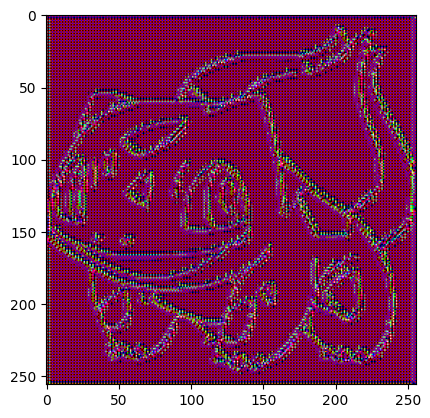

In [19]:
# By the time we get here we MUST have shape(1, 256, 256, 3), even after all the DMI and AdaIn from the VGG

# TEST THE GENERATOR
gen_model_output = gen_model(sketch[tf.newaxis, ...], training=False)
#gen_model_output = tf.squeeze(gen_model_output, axis=0)
#print(gen_model_output)

plt.imshow(gen_model_output[0, ...])

# **DEFINE GENERATOR LOSS**

### **UPDATED GENERATOR LOSS FUNCTION**

In [21]:
# style = style image

# L(G) = E[log(P(G(Isketch, Istyle)))] + MSE(C(G(Isketch, Istyle)), Isketch) + MSE(S(G(Isketch, Istyle)), E(Istyle)).

LAMBDA = 100

binCrossEnt = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def updated_generator_loss(disc_generated_output, gen_output, target, idn_content, original_sketch, idn_style, style_feature_map):

    # E[log(P(G(Isketch, Istyle)))]
    gan_loss = binCrossEnt(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error, for enforcing perceptual loss, measuring the pixel-wise diff
    # between the Gen output and ground truth.
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    # MSE(C(G(Isketch, Istyle)), Isketch)
    content_loss = tf.keras.losses.MeanSquaredError()(idn_content, original_sketch)

    # MSE(S(G(Isketch, Istyle)), E(Istyle))
    style_loss = tf.keras.losses.MeanSquaredError()(idn_style, style_feature_map)
    
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + content_loss + style_loss

    return total_gen_loss, gan_loss, l1_loss, content_loss, style_loss


# **INSTANCE DE-NORMALIZATION**

In [22]:
def idn(input_tensor, in_channel, style_dim, content_channel=1):

    # Take a tensor as input, predict out the:
    # 1. grey-scale sketch image
    # 2. style feature vector

    # In adaIN: result_feature = [(content_feature - mu_c) / sigma_c ] * sigma_s + mu_s,
    # where mu_c and sigma_c = mu content and sigma content respectively
    # so we can first get mu_s by a conv layer, where mu_s = mu style
    # Then we can calculate the sigma_s from (result_feature - mu_s) where sigma_s = sigma style
    # Then we get the content feature using the (result_feature - mu_s)/sigma_s

    # Define the style_mu_conv layer
    style_mu_conv = tf.keras.Sequential([
        tf.keras.layers.Conv2D(in_channel, kernel_size=4, strides=2, padding='same'),
        tf.keras.layers.LeakyReLU(alpha=0.1),
        tf.keras.layers.Conv2D(in_channel, kernel_size=4, strides=2, padding='same'),
        tf.keras.layers.LeakyReLU(alpha=0.1),
        tf.keras.layers.GlobalAveragePooling2D()])

    # Define the to_style layer
    to_style = tf.keras.layers.Dense(style_dim)

    # Define the to_content layer
    to_content = tf.keras.Sequential([
        tf.keras.layers.Conv2D(in_channel, kernel_size=3, strides=1, padding='same'),
        tf.keras.layers.LeakyReLU(alpha=0.1),
        tf.keras.layers.Conv2D(content_channel, kernel_size=3, strides=1, padding='same'),
        tf.keras.layers.LeakyReLU(alpha=0.1),
        tf.keras.layers.GlobalAveragePooling2D()])

    # Compute style_mu
    style_mu = style_mu_conv(input_tensor)
    
    # Compute style_sigma
    feat_no_style_mu = input_tensor - style_mu
    style_sigma = tf.math.reduce_std(tf.reshape(feat_no_style_mu, (tf.shape(input_tensor)[0], in_channel, -1)), axis=-1)
    
    # Compute feat_content
    feat_content = feat_no_style_mu / tf.reshape(style_sigma, (tf.shape(input_tensor)[0], in_channel, 1, 1))
    
    # Compute style
    style = to_style(tf.concat([tf.reshape(style_mu, (tf.shape(input_tensor)[0],-1)), tf.reshape(style_sigma, (tf.shape(input_tensor)[0],-1))], axis=1))

    # Compute content
    content = to_content(feat_content)

    return content, style


# **PATCH GAN DISCRIMINATOR MODEL**

In [25]:
# example of defining a 70x70 patchgan discriminator model
# functional API

# Define the discriminator model
def define_discriminator(image_shape):

    # Weight initialization
	init = tf.random_normal_initializer(0., 0.02)
	# Source image input
	in_src_image = Input(shape=image_shape)
	# Target image input
	in_target_image = Input(shape=image_shape)
	# Concatenate images channel-wise
	merged = Concatenate()([in_src_image, in_target_image])
 
	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)

	zero_pad1 = tf.keras.layers.ZeroPadding2D()(d)

	# C512
	d = Conv2D(512, (4,4), strides=(1,1), padding='same', kernel_initializer=init, use_bias=False)(zero_pad1)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
 
	zero_pad2 = tf.keras.layers.ZeroPadding2D()(d)
  
	# second last output layer
	# d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	# d = BatchNormalization()(d)
	# d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), strides=1, padding='same', kernel_initializer=init)(zero_pad2)

	#patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], d)
	# compile model
	# opt = Adam(learning_rate=0.0002, beta_1=0.5)
	# model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

# define image shape
image_shape = (256,256,3)
# create the model
disc_model = define_discriminator(image_shape)
# summarize the model
#disc_model.summary()
# plot the model
#plot_model(disc_model, to_file='discriminator_model_plot.png', show_shapes=True, show_layer_names=True, dpi=64)


# **TEST THE DISCRIMINATOR**

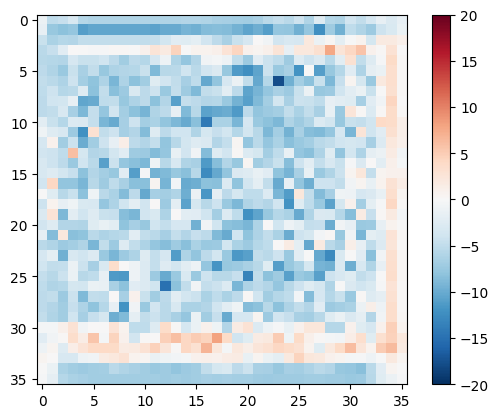

In [ ]:
# TEST THE DISCRIMINATOR
disc_output = disc_model([sketch[tf.newaxis, ...], gen_model_output], training=False)
plt.imshow(disc_output[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

# **DEFINE DISCRIMINATOR LOSS**

### **UPDATED DISCRIMINATOR LOSS FUNCTION**

In [23]:
# target = real / ground truth image

# L(D) = E[log(P(Ireal))] + E[log(1 − P(G(Isketch, Istyle)))] + MSE(S(Ireal), E(Ireal)) + MSE(C(Ireal), Ireal−sketch)

binCrossEnt = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def updated_discriminator_loss(disc_real_output, disc_generated_output, ground_truth_feature_map, original_sketch, style_feature_map, idn_style):
    
    # E[log(P(Ireal))]
    real_loss = binCrossEnt(tf.ones_like(disc_real_output), disc_real_output)

    # E[log(1 − P(G(Isketch, Istyle)))]
    generated_loss = binCrossEnt(tf.zeros_like(disc_generated_output), disc_generated_output)

    # MSE(S(Ireal), E(Ireal)) - Compare style extracted from original ground truth style image, and the style vector from the IDN
    style_loss = tf.keras.losses.MeanSquaredError()(style_feature_map, idn_style)

    # resize the original sketch image to match the size of the ground truth feature map
    # This is required for broadcasting
    resized_original_sketch = tf.image.resize(original_sketch, (8, 8))
    resized_original_sketch = tf.transpose(resized_original_sketch, perm=[3, 1, 2, 0]) # permute to match dimensions of resized orig sketch
    resized_original_sketch = tf.repeat(resized_original_sketch, repeats=512, axis=-1)

    # MSE(C(Ireal), Ireal−sketch) # this is not a subtraction, this is a MSE of the content (C) feature maps of both
    # the ground truth image (Ireal) and the input sketch image, which is a sketch of the ground truth i.e. (Ireal−sketch)  
    content_loss = tf.keras.losses.MeanSquaredError()(ground_truth_feature_map, resized_original_sketch)

    # Total discriminator loss
    total_disc_loss = real_loss + generated_loss + style_loss + content_loss

    return total_disc_loss, real_loss, generated_loss, style_loss, content_loss


# **DEFINE OPTIMIZERS AND CHECKPOINT SAVER**

In [26]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=gen_model,
                                 discriminator=disc_model)

# **GENERATE IMAGES**

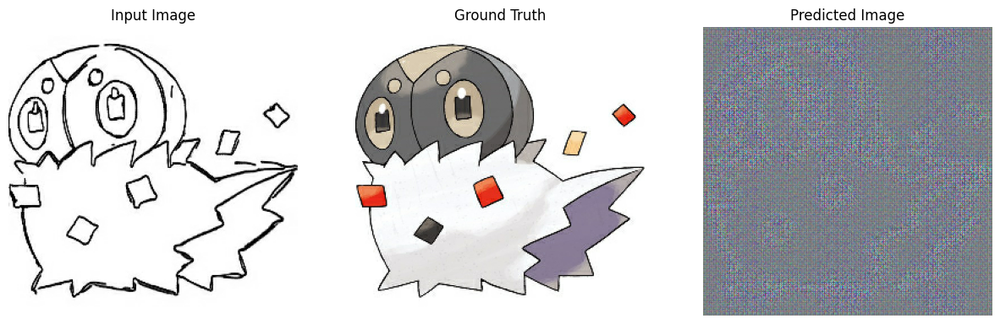

In [27]:
def generate_images(model, test_input, tar):

    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))    
    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']  

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])

        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')

    plt.show()

# Test the above function
for example_input, example_target in test_dataset.take(1):
    generate_images(gen_model, example_input, example_target)

# **LOAD TENSORBOARD**

In [28]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

# Clear any logs from previous runs
!rm -rf ./logs/ 

# **TRAINING**

In [82]:
log_dir="logs/"

current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)

# Define metrics for avgeraging local losses after each step
generator_total_loss_metric = tf.keras.metrics.Mean(name='generator_total_loss')
generator_gan_loss_metric = tf.keras.metrics.Mean(name='generator_gan_loss')
generator_l1_loss_metric = tf.keras.metrics.Mean(name='generator_l1_loss')
generator_content_loss_metric = tf.keras.metrics.Mean(name='generator_content_loss')
generator_style_loss_metric = tf.keras.metrics.Mean(name='generator_style_loss')

discriminator_total_loss_metric = tf.keras.metrics.Mean(name='discriminator_total_loss')
discriminator_real_loss_metric = tf.keras.metrics.Mean(name='discriminator_real_loss')
discriminator_generated_loss_metric = tf.keras.metrics.Mean(name='discriminator_generated_loss')
discriminator_style_loss_metric = tf.keras.metrics.Mean(name='discriminator_style_loss')
discriminator_content_loss_metric = tf.keras.metrics.Mean(name='discriminator_content_loss')

# Decalred in global scope for printing use in fit function
# Updated in training function
gen_total_loss = 0
gen_gan_loss = 0
gen_l1_loss = 0
gen_content_loss = 0
gen_style_loss = 0

disc_total_loss = 0
disc_real_loss = 0
disc_generated_loss = 0
disc_style_loss = 0
disc_content_loss = 0

#@tf.function
def train_step(in_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_model_output = gen_model(in_image, training=True)

        disc_real_output = disc_model([in_image, target], training=True)

        # P(I) returned prediction, value close to 1 = real, value close to 0 = fake
        disc_generated_output = disc_model([in_image, gen_model_output], training=True)

        #print("disc_generated_output shape: ", disc_generated_output.shape)     #(1, 36, 36, 1)

        # save current original image before it is updated by the IDN
        # this is needed for passing to the loss functions
        original_sketch = in_image

        # C(I)      S(I)
        in_image, style_image = idn(disc_generated_output, 1, 512, content_channel=1)

        # Original gen loss call
        #gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_model_output, target)

        #print("Just before G")
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_content_loss, gen_style_loss = updated_generator_loss(disc_generated_output,
                                                                                                     gen_model_output,
                                                                                                     target,
                                                                                                     in_image,
                                                                                                     original_sketch,
                                                                                                     style_image,
                                                                                                     style_feature_map)        
        # Original disc loss call
        #disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

        # might need to preprocess "target" image before passing to vgg
        ground_truth_feature_map = vgg_model(target)

        #print("Just before D")
        disc_total_loss, disc_real_loss, disc_generated_loss, disc_style_loss, disc_content_loss = updated_discriminator_loss(disc_real_output,
                                                                                                                      disc_generated_output,
                                                                                                                      ground_truth_feature_map,
                                                                                                                      original_sketch,
                                                                                                                      style_feature_map,
                                                                                                                      style_image)

    #print("returned from D loss")

    # Update local metrics
    generator_total_loss_metric.update_state(gen_total_loss)
    generator_gan_loss_metric.update_state(gen_gan_loss)
    generator_l1_loss_metric.update_state(gen_l1_loss)
    generator_content_loss_metric.update_state(gen_content_loss)
    generator_style_loss_metric.update_state(gen_style_loss)
    
    discriminator_total_loss_metric.update_state(disc_total_loss)
    discriminator_real_loss_metric.update_state(disc_real_loss)
    discriminator_generated_loss_metric.update_state(disc_generated_loss)
    discriminator_style_loss_metric.update_state(disc_style_loss)
    discriminator_content_loss_metric.update_state(disc_content_loss)

    # Calculate gradients
    generator_gradients = gen_tape.gradient(gen_total_loss, gen_model.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_total_loss, disc_model.trainable_variables)

    # Apply gradients
    generator_optimizer.apply_gradients(zip(generator_gradients, gen_model.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc_model.trainable_variables))

    if (step) % 100 == 0:

        # sys.stdout.write("\rIteration: {} Loss: {:.4f}".format(step, gen_total_loss))
        # sys.stdout.flush()


        # Print losses every 1000 steps
        # Generator losses
        template = 'Gen Total Loss:\t {:.3f},\t Gen GAN Loss:\t {:.3f},\t Gen L1 Loss:\t\t {:.3f},\t Gen Content Loss: {:.3f},\t\t Gen Style Loss:\t {:.3f}'
        print(template.format(gen_total_loss, gen_gan_loss, gen_l1_loss, gen_content_loss, gen_style_loss))

        # Discriminator losses
        template = 'Dis Total Loss:\t {:.3f}, Dis Real Loss:\t {:.3f},\t Dis Generated Loss:\t {:.3f},\t Dis Content Loss: {:.3f},\t Dis Style Loss:\t {:.3f}'
        print(template.format(disc_total_loss, disc_real_loss, disc_generated_loss, disc_content_loss, disc_style_loss))

        print()

    # Write to Tensorboard
    with train_summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//100)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//100)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//100)
        tf.summary.scalar('gen_content_loss', gen_content_loss, step=step//100)
        tf.summary.scalar('gen_style_loss', gen_style_loss, step=step//100)

        tf.summary.scalar('disc_total_loss', disc_total_loss, step=step//100)
        tf.summary.scalar('disc_real_loss', disc_real_loss, step=step//100)
        tf.summary.scalar('disc_generated_loss', disc_generated_loss, step=step//100)
        tf.summary.scalar('disc_content_loss', disc_content_loss, step=step//100)
        tf.summary.scalar('disc_style_loss', disc_style_loss, step=step//100)
        
        #print("Error 11")
        # Note the removal of the floor division by 100 as it's not necessary as I want to log this summary scalar less frequently.
        #tf.summary.scalar('disc_generated_output prediction', disc_generated_output, step=step)

# ACTUAL TRAINING
def fit(train_ds, test_ds, steps):
    test_ds_input, test_ds_target = next(iter(test_ds.take(1)))
    start = time.time()

    for step, (in_image, target) in train_ds.repeat().take(steps).enumerate():
        # Display an image every 1000 steps
        if (step) % 1000 == 0:
            display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()

            generate_images(gen_model, test_ds_input, test_ds_target)
            print(f"Steps Taken: {step//1000}k")
            print()

            # Shuffle the train_ds dataset every 1000 steps so that the next 1000 steps
            # of training are conducted over the same training data but in a different order
            train_ds = train_ds.shuffle(buffer_size=640)

        train_step(in_image, target, step)

        # Training step
        # if (step + 1) % 10 == 0:
        #     print('.', end='', flush=True)

        # Save (checkpoint) the model every 5000 steps
        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

# **RUN TRAINING LOOP**

Time taken for 1000 steps: 526.24 sec



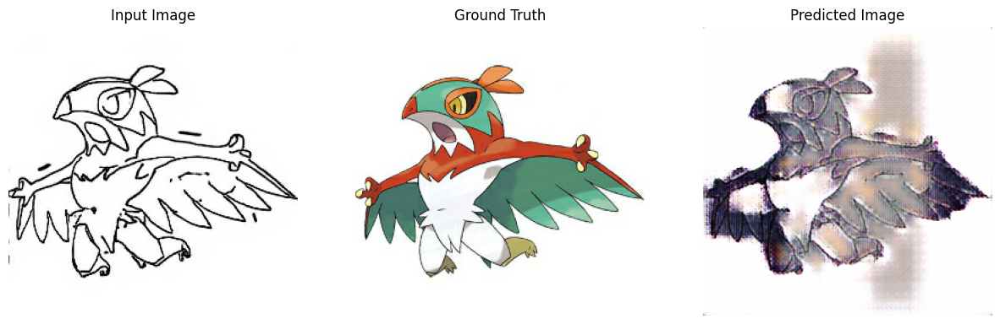

Steps Taken: 9k

Gen Total Loss:	 48.086,	 Gen GAN Loss:	 2.220,	 Gen L1 Loss:		 0.428,	 Gen Content Loss: 0.446,		 Gen Style Loss:	 2.573
Dis Total Loss:	 8256572882944.000, Dis Real Loss:	 0.002,	 Dis Generated Loss:	 0.156,	 Dis Content Loss: 8256572882944.000,	 Dis Style Loss:	 2.573

Gen Total Loss:	 42.075,	 Gen GAN Loss:	 5.215,	 Gen L1 Loss:		 0.338,	 Gen Content Loss: 0.457,		 Gen Style Loss:	 2.576
Dis Total Loss:	 6515951927296.000, Dis Real Loss:	 0.135,	 Dis Generated Loss:	 0.008,	 Dis Content Loss: 6515951927296.000,	 Dis Style Loss:	 2.576

Gen Total Loss:	 59.650,	 Gen GAN Loss:	 7.094,	 Gen L1 Loss:		 0.487,	 Gen Content Loss: 1.310,		 Gen Style Loss:	 2.589
Dis Total Loss:	 22309070962688.000, Dis Real Loss:	 0.001,	 Dis Generated Loss:	 0.002,	 Dis Content Loss: 22309070962688.000,	 Dis Style Loss:	 2.589

Gen Total Loss:	 33.832,	 Gen GAN Loss:	 5.276,	 Gen L1 Loss:		 0.253,	 Gen Content Loss: 0.713,		 Gen Style Loss:	 2.574
Dis Total Loss:	 24403825917952.000, Dis

<IPython.core.display.Javascript object>

In [83]:
#tf.keras.backend.clear_session()

fit(train_dataset, test_dataset, steps=10000)

%tensorboard --logdir logs/gradient_tape

# **RESTORE LATEST CHECKPOINT AND TEST NETWORK**

In [ ]:
#!ls {checkpoint_dir}

# Restoring the latest checkpoint in checkpoint_dir
#checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

# **GENERATE IMAGES USING TEST SET**

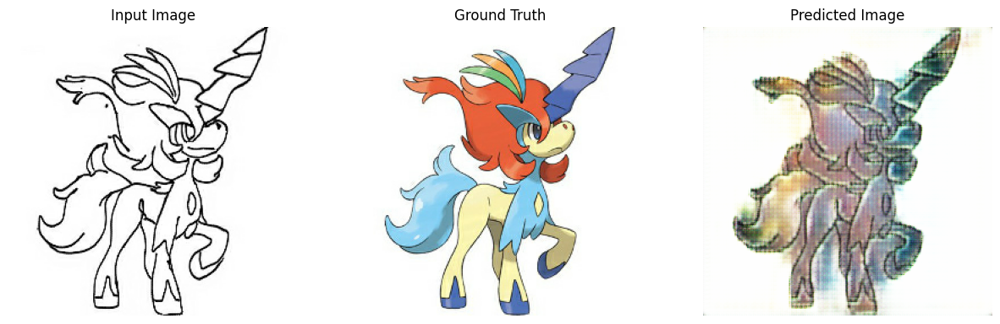

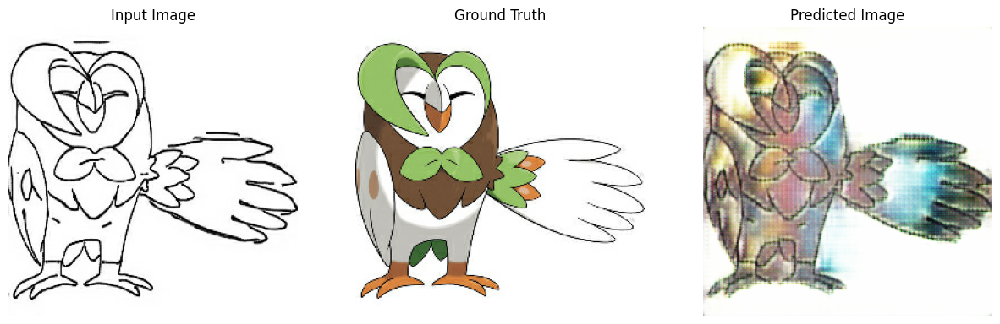

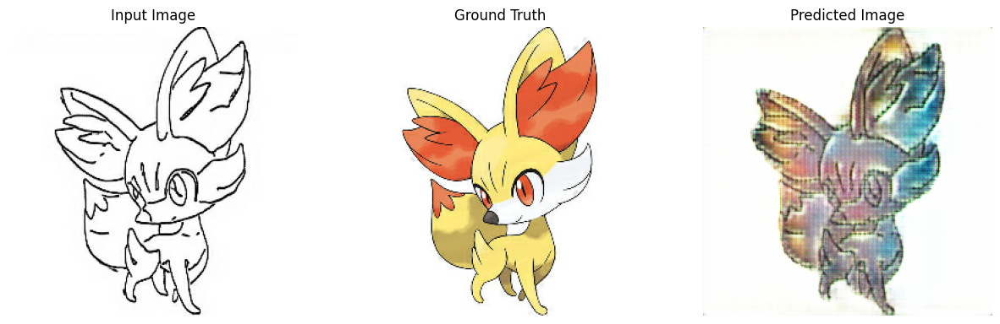

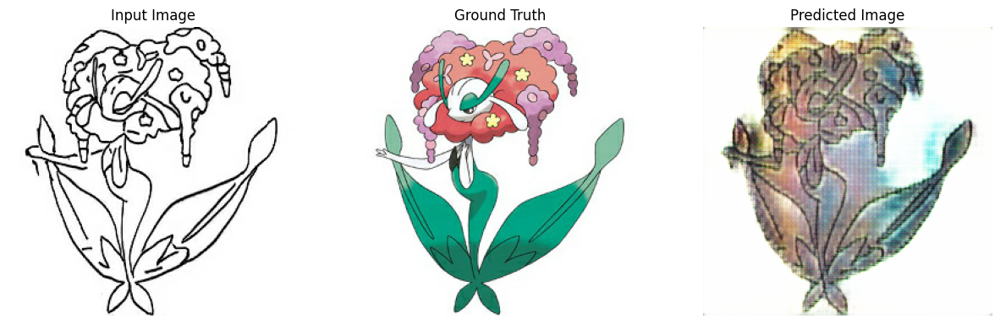

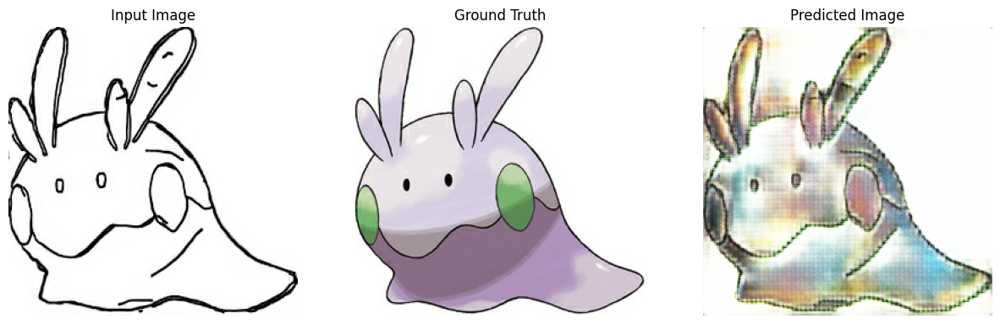

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
    generate_images(gen_model, inp, tar)

# **CALCULATE FID**